In [43]:
import numpy as np
import pandas as pd
import networkx as nx
from IPython.display import Image

# LUCAS0 "unbiased" test set generation

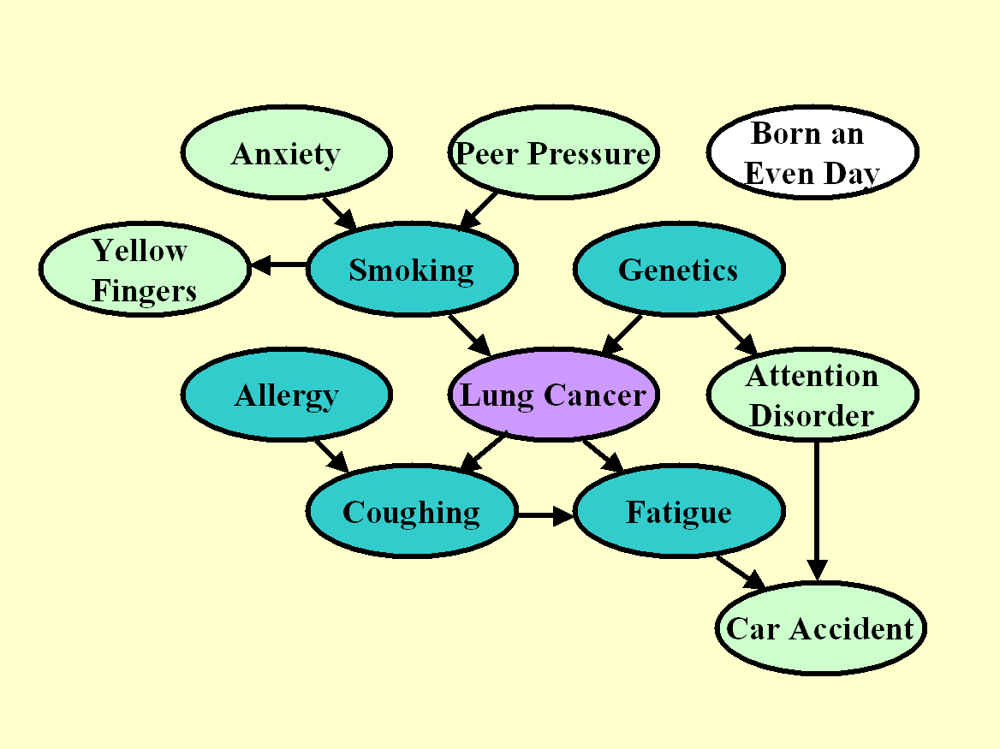

In [44]:
Image(filename="img/lucas0_causal_graph.gif")

In [45]:
attributes = [
    "anxiety",
    "peer pressure",
    "yellow fingers",
    "smoking",
    "genetics",
    "allergy",
    "lung cancer",
    "attention disorder",
    "coughing",
    "fatigue",
    "car accident"
]   

In [46]:
causalgraph = nx.DiGraph()
causalgraph.add_weighted_edges_from([
    (1, 4, 0.4),
    (2, 4, 0.6),
    (4, 3, 1),
    (4, 7, 0.6),
    (5, 7, 0.4),
    (5, 8, 1),
    (6, 9, 0.7),
    (7, 9, 0.3),
    (7, 10, 0.6),
    (8, 11, 0.2),
    (9, 10, 0.4),
    (10, 11, 0.8)
])

In [47]:
def func(data, preds):
    val = 0
    for edge in preds:
        val += data[edge[0]-1] * edge[2]["weight"]
    return val + np.random.normal()*0.05

def generate_data(N, n_nodes, causalgraph, specialnodes=None):
    topsort = list(nx.topological_sort(causalgraph))
    data = np.zeros((N, n_nodes))
    for i in range(N):
        for j in topsort:
            preds = list(causalgraph.in_edges(j, data=True))
            if len(preds) == 0:
                mu = 0
                sigma = 1
                if specialnodes and j in specialnodes:
                    if specialnodes[j][0] == "2distrib":
                        mu, sigma = specialnodes[j][2] if (np.random.random() < specialnodes[j][1]) else specialnodes[j][3]
                data[i][j-1] = np.random.normal(mu, sigma)
            else:
                data[i][j-1] = func(data[i], preds)
    return data

In [48]:
data = generate_data(10000, 11, causalgraph)
df = pd.DataFrame(columns=attributes, data=data)
df

,anxiety,peer pressure,yellow fingers,smoking,genetics,allergy,lung cancer,attention disorder,coughing,fatigue,car accident
0,0.288563,-1.747212,-0.883690,-0.927955,0.440381,0.202163,-0.406152,0.474315,0.033109,-0.180731,-0.105353
1,0.737976,-1.453080,-0.657351,-0.631140,-0.218192,1.502056,-0.471947,-0.272078,0.852718,0.070411,0.014555
2,0.451595,-0.627038,-0.102228,-0.129850,-0.189481,1.020668,-0.110404,-0.187172,0.719975,0.148902,0.120670
3,-0.423868,-0.182608,-0.233109,-0.303945,0.141161,-0.760496,-0.132775,0.164245,-0.544987,-0.280320,-0.107794
4,-1.142828,1.157558,0.131969,0.202843,-0.216443,-0.340802,0.048754,-0.187872,-0.164591,-0.045269,-0.135313
...,...,...,...,...,...,...,...,...,...,...,...
9995,0.192883,-0.148669,0.070356,0.065850,1.654337,-0.367997,0.625998,1.651139,-0.063873,0.310868,0.545433
9996,-0.732582,0.137494,-0.208155,-0.192745,0.390912,-0.172282,0.018522,0.397054,-0.072625,-0.077135,-0.103725
9997,-1.283550,-0.469069,-0.758361,-0.782057,0.094077,-0.029132,-0.424983,0.045524,-0.122041,-0.372033,-0.358217
9998,-0.478783,-0.177364,-0.320349,-0.244988,0.105512,-0.229899,-0.184919,0.176616,-0.213337,-0.187682,-0.161413


In [49]:
data.shape

(10000, 11)

[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  1  0  0  0  0  0  0  0]
 [ 0  0 -1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 -1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 -1  0  0  0  0  0  0  0]
 [ 0  0 -1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0 

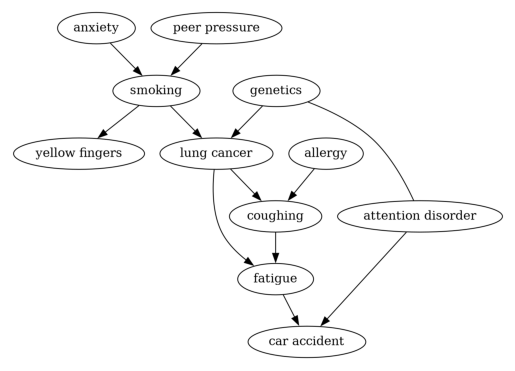

In [50]:
from causallearn.search.ScoreBased.GES import ges
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

res = ges(data)
pyd = GraphUtils.to_pydot(res['G'], labels=attributes)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

# Test set visualization

## General pairplot

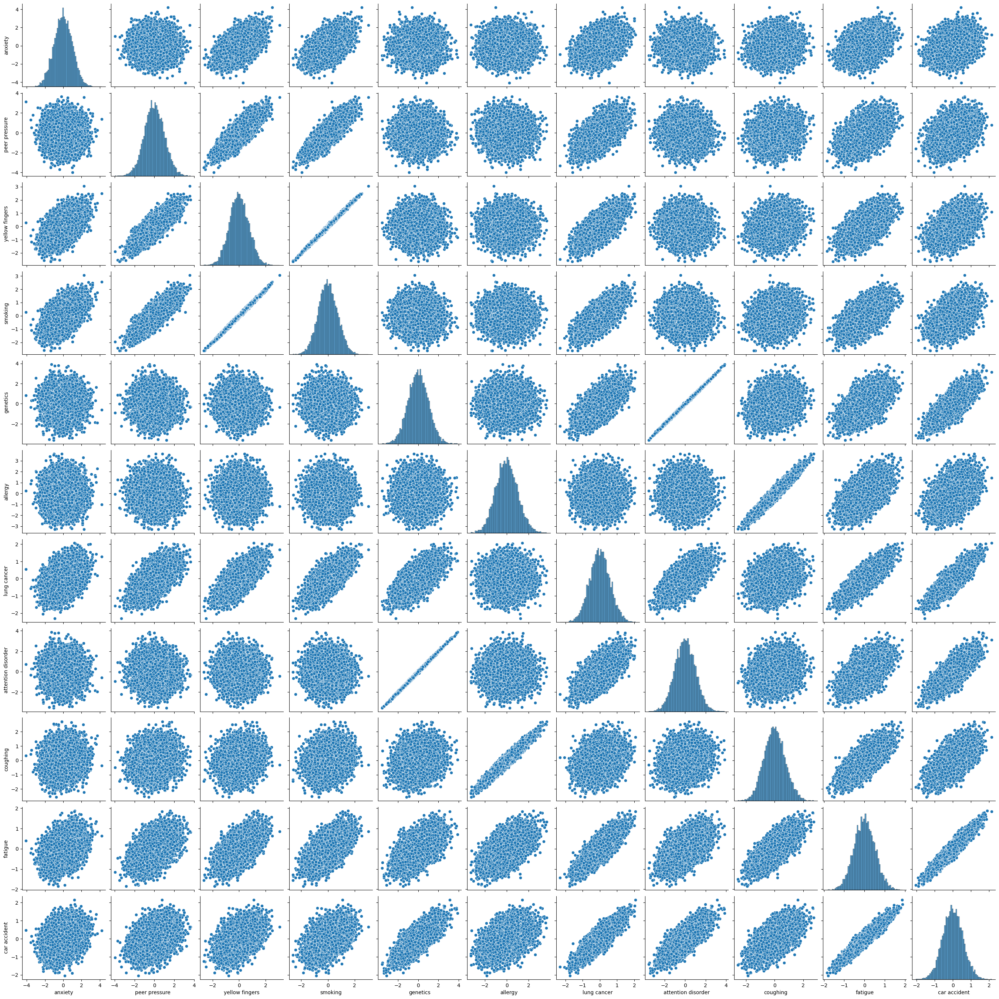

In [51]:
import seaborn
# seaborn.pairplot(df)
Image(filename="img/lucas0_test_pairplots.png")

## Focused pairplot

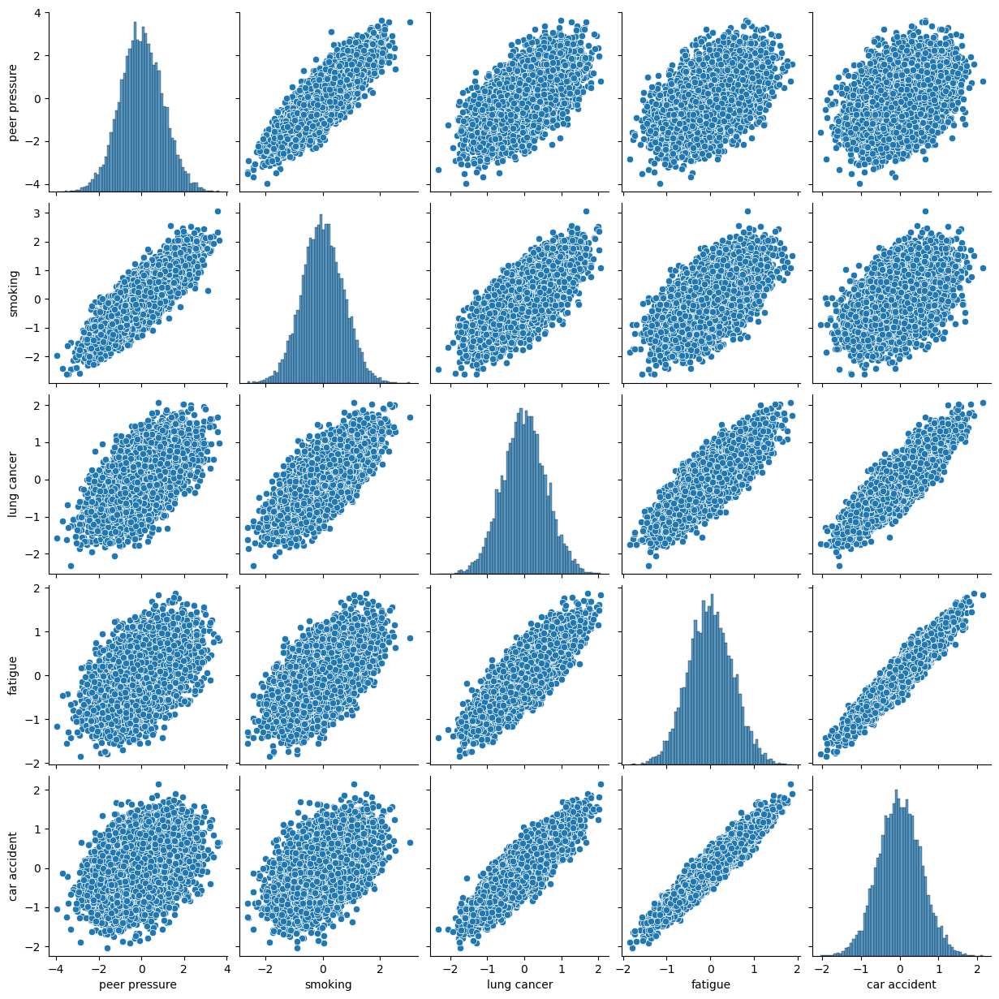

In [52]:
# seaborn.pairplot(df, vars=["peer pressure", "smoking", "lung cancer", "fatigue", "car accident"])
Image(filename="img/lucas0_test_pairplots_focused.png")

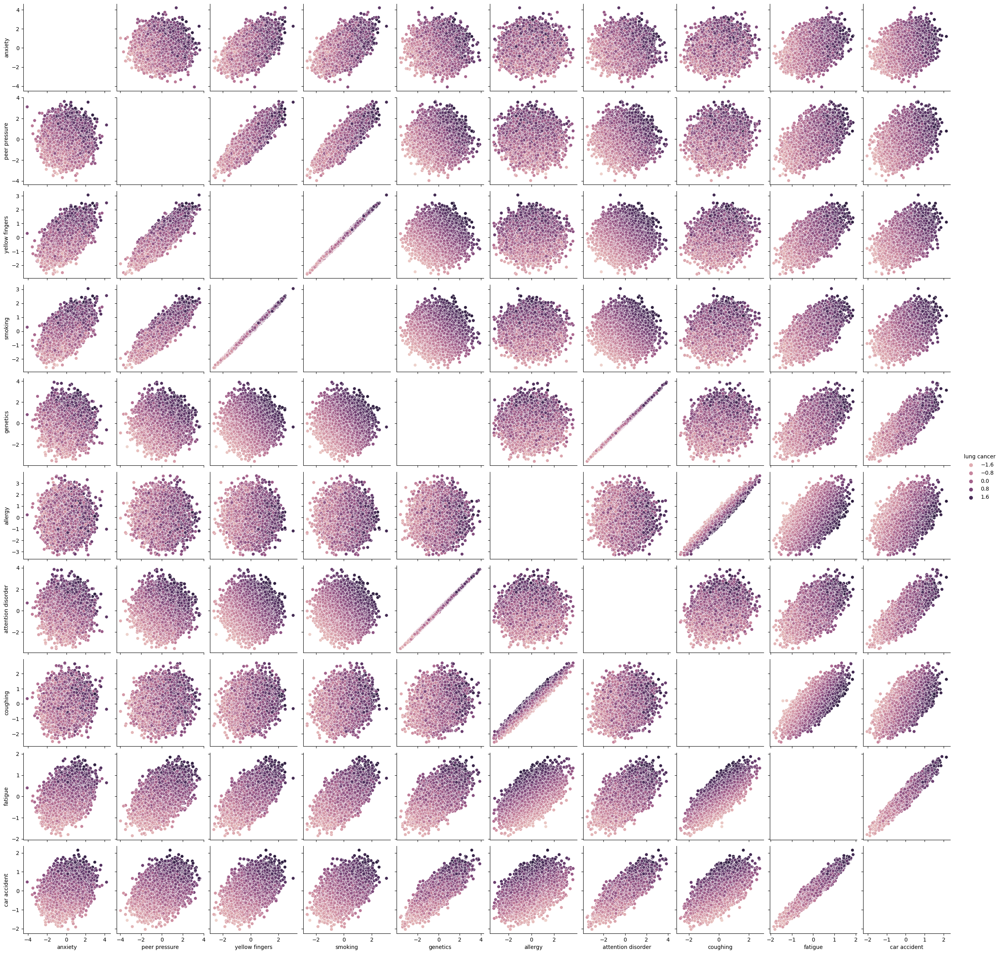

In [53]:
Image(filename="img/lucas0_test_pairplots_hued.png")

# Spurious relationships

## Birth mortality example

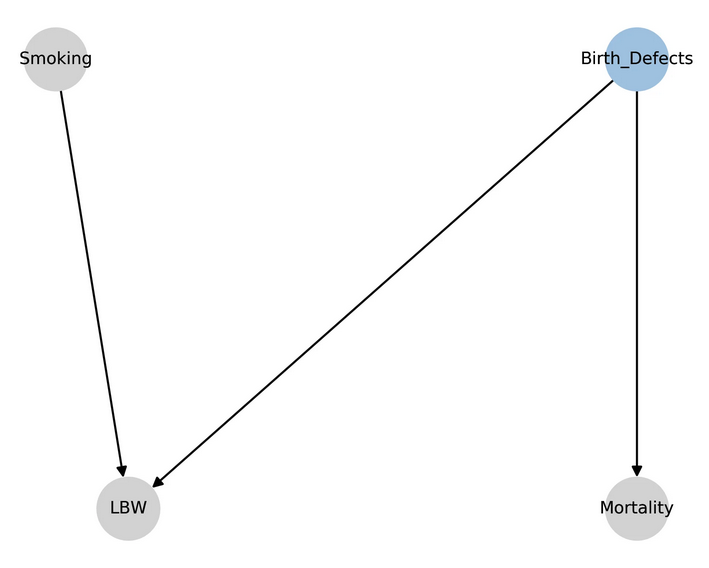

In [54]:
Image(filename="img/spurious.png")

According to this graph, if a baby is born with low birth weight, it is because of a combination of the mother smoking and genetic defects. That means that if the mother didn't smoke, it is 100% genetic defects, and vice versa. If we condition on LWB, that induces a new *spurious* negative correlation between smoking and birth defects, as if low birth weight is true, then the higher "Smoking" the lower "Birth_Defects" and vice versa.

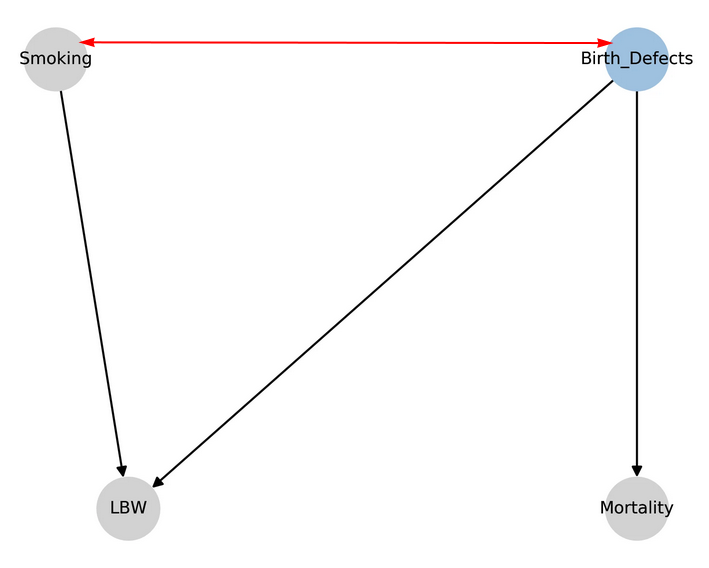

In [55]:
Image(filename="img/spurious2.png")

So now the higher the smoking, the lower the birth defects, and since mortality is positively correlated with birth defects and not with smoking, then the lower the mortality.

It is possible to reproduce this scenario in the LUCAS0 causal graph.
- Lung cancer is caused by Smoking and Genetics
- If we condition on Lung Cancer, there's a negative correlation between Lung Cancer and Genetics
- Genetics also cause Attention Disorder
- So the lower the smoking, the higher the attention disorder.

## Adding a genetic factor as smoking/lung cancer cofounder

In [56]:
causalgraph = nx.DiGraph()
causalgraph.add_weighted_edges_from([
    (1, 4, 0.2),
    (2, 4, 0.4),
    (4, 3, 1),
    (4, 7, 0.3),
    (5, 7, 0.3),
    (5, 8, 1),
    (6, 9, 0.7),
    (7, 9, 0.3),
    (7, 10, 0.6),
    (8, 11, 0.2),
    (9, 10, 0.4),
    (10, 11, 0.8),
    (12, 4, 0.4),
    (12, 7, 0.4)
])

attributes2 = attributes+["genetic2"]

In [57]:
data = generate_data(10000, 12, causalgraph)
# data = np.delete(data, 11, axis=1)
df = pd.DataFrame(columns=attributes2, data=data)
df


,anxiety,peer pressure,yellow fingers,smoking,genetics,allergy,lung cancer,attention disorder,coughing,fatigue,car accident,genetic2
0,-0.623492,0.584269,-0.594415,-0.563690,-0.010604,0.095602,-0.830550,-0.068119,-0.200067,-0.576554,-0.422556,-1.823542
1,0.540362,0.243299,0.681537,0.679513,1.051180,-0.194501,0.946834,1.099830,0.160873,0.667478,0.696356,1.142700
2,-0.918819,-0.051615,0.280669,0.273291,1.145367,0.318427,0.884862,1.199854,0.467748,0.687283,0.811944,1.105038
3,0.778226,1.017037,0.416215,0.361367,0.186554,-1.157345,-0.062883,0.192151,-0.806521,-0.295870,-0.278559,-0.540183
4,1.843212,-1.264136,-0.184034,-0.230456,-0.436063,-0.711434,-0.270791,-0.416806,-0.651578,-0.319161,-0.367483,-0.161268
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.562932,1.531282,0.300103,0.308746,-1.168463,0.593396,-0.469332,-1.149421,0.353180,-0.146173,-0.328669,-0.496328
9996,0.172592,0.754063,0.371305,0.372257,-0.367365,-1.246942,0.110160,-0.282764,-0.869858,-0.189878,-0.148739,0.259998
9997,-0.261572,-1.023304,0.028459,-0.001446,-0.271751,-1.169726,0.386021,-0.270822,-0.715539,-0.133663,-0.205590,1.063344
9998,0.415751,0.573543,0.787824,0.815958,-0.143550,-1.027802,0.613670,-0.150607,-0.528982,0.128078,0.031756,0.938917


### Providing the extra attribute

[[ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 -1  0  0  0  0  0  0  0  0]
 [ 0  0  1  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 -1  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 

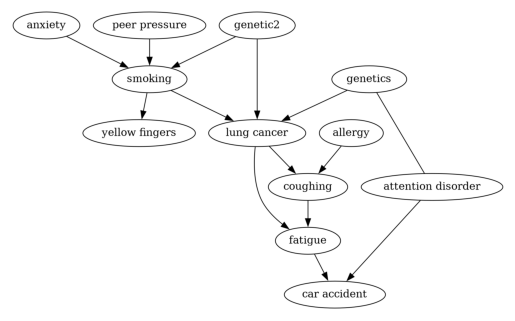

In [58]:
res = ges(data)
pyd = GraphUtils.to_pydot(res['G'], labels=attributes2)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

### Hiding the extra attribute

[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 -1  0  0  0  0  0  0  0]
 [ 0  0  1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 -1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]]
[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 -1  0  0  0  0  0  0  0]
 [ 0  0 -1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 -1  0  0  0]
 [ 0  0  0  0  0  0  0  0 

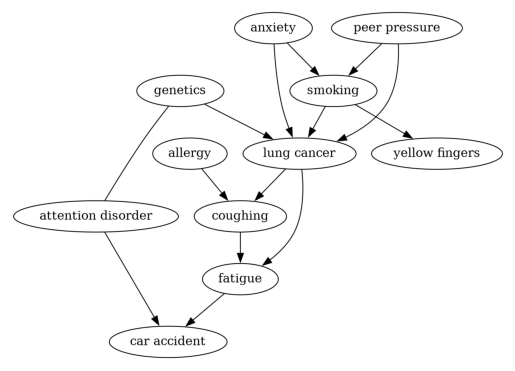

In [59]:
data = np.delete(data, 11, axis=1)
df = pd.DataFrame(columns=attributes, data=data)
res = ges(data)
pyd = GraphUtils.to_pydot(res['G'], labels=attributes)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

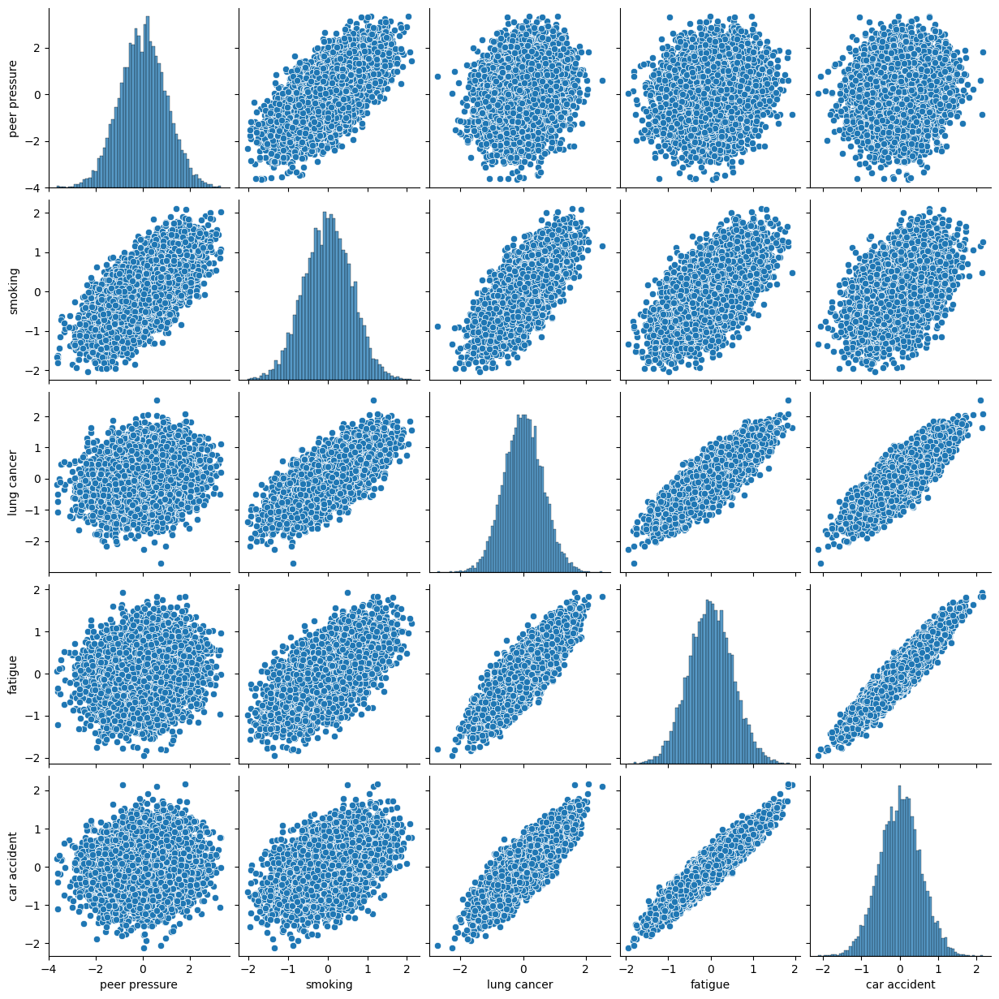

In [60]:
seaborn.pairplot(df, vars=["peer pressure", "smoking", "lung cancer", "fatigue", "car accident"])
# Image(filename="img/lucas0_spurious_pairplots_focused.png")

## Differently calibrated machines at 2 different hospitals

Here, we imagine that the data comes 50/50 from 2 different hospitals with different calibrations for an instrument that "measure genetics". We add two parent nodes for genetics, Hospital 1 and Hospital 2, however Hostpital 2 is generated using *N*(3, 0.8) instead of *N*(0,1).

In [72]:
causalgraph = nx.DiGraph()
causalgraph.add_weighted_edges_from([
    (1, 4, 0.2),
    (2, 4, 0.4),
    (4, 3, 1),
    (4, 7, 0.3),
    (5, 7, 0.3),
    (5, 8, 1),
    (6, 9, 0.7),
    (7, 9, 0.3),
    (7, 10, 0.6),
    (8, 11, 0.2),
    (9, 10, 0.4),
    (10, 11, 0.8),
    # (12, 5, 1),
    # (13, 5, 1)
])

In [90]:
data = generate_data(10000,
                     11,
                     causalgraph,
                     specialnodes={5: ["2distrib", 0.5, (0, 1), (3.5, 1.5)]})
# data = np.delete(data, [11, 12], axis=1)
df = pd.DataFrame(columns=attributes, data=data)
df

,anxiety,peer pressure,yellow fingers,smoking,genetics,allergy,lung cancer,attention disorder,coughing,fatigue,car accident
0,-1.025004,-1.074088,-0.764362,-0.678133,-2.001917,-0.205434,-0.801374,-2.076885,-0.406698,-0.568826,-0.866160
1,0.880447,-1.282412,-0.289649,-0.333070,4.099664,-0.702207,1.137086,4.092314,-0.182514,0.587283,1.303381
2,0.413898,0.431052,0.212425,0.250045,2.699990,1.307108,0.822388,2.719282,1.153632,0.864203,1.197050
3,-0.004836,-2.231249,-0.989578,-0.932296,0.242032,-2.907516,-0.225452,0.229755,-2.025291,-0.930010,-0.671875
4,-0.220628,-0.583624,-0.325099,-0.340654,2.545078,-0.019250,0.629070,2.549403,0.264617,0.522790,0.947627
...,...,...,...,...,...,...,...,...,...,...,...
9995,-1.871386,-0.675573,-0.711652,-0.659341,3.563851,0.340369,0.871771,3.494291,0.364072,0.720808,1.223195
9996,-0.681594,1.470223,0.505410,0.448174,-0.310687,0.717896,0.025284,-0.259130,0.473067,0.271278,0.154179
9997,0.693393,-1.796666,-0.614924,-0.586949,2.765979,0.366969,0.665786,2.730952,0.490233,0.537627,0.919275
9998,-0.074627,0.981656,0.363467,0.356079,-0.022027,-0.330010,0.033690,-0.005501,-0.237794,-0.056296,-0.077153


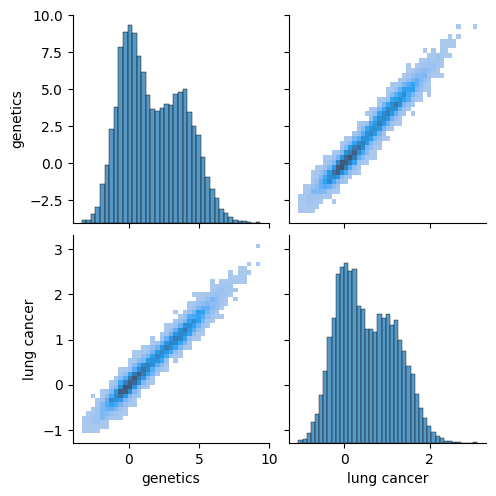

In [91]:
seaborn.pairplot(df, vars=["genetics", "lung cancer"], kind="hist")